# OMIS 114 Data Science with Python Final Project

# Analyzing NBA Statistics

#### By Atharv Patil & Ishaan Krishnakumar

##### Research Question:
How can data science be used to predict the performance of NBA players and their impact on team success? 

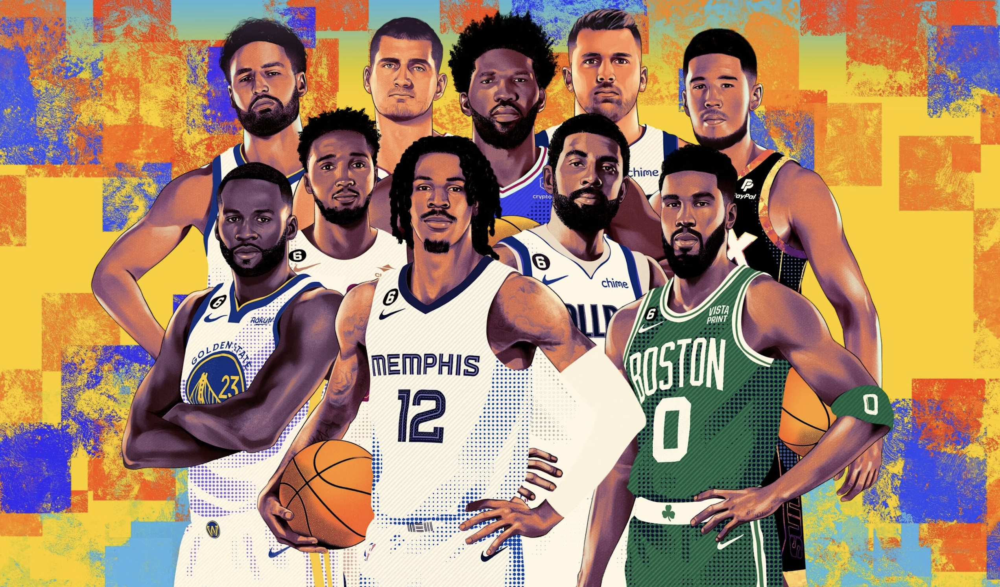

######  Introduction:
Analyzing the performance data of NBA players can help us identify patterns and factors that contribute to team success in several ways. Firstly, we can look at individual player statistics to see which players consistently perform at a high level, and which statistics are most strongly correlated with team success. For example, we might find that teams with high-scoring players tend to win more games, or that teams with players who excel in assists and rebounds are more likely to succeed. Additionally, by analyzing team-level statistics, we can gain insights into how different aspects of team performance are related. These insights can be used by team managers and coaches to make data-driven decisions when it comes to player recruitment and game strategy. For example, teams might use this data to identify undervalued players who have high potential for success, or to develop game strategies that play to their team's strengths and exploit their opponents' weaknesses. Coaches can also use this data to make in-game adjustments, such as making substitutions or changing defensive strategies based on real-time performance data. With the data explorations below, the research question will be answered by using the information taught in the class. 

##### Data Processing Importation Required 

In [155]:
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn as sk
import sklearn.tree as tree
from IPython.display import Image  
import pydotplus
from matplotlib import pyplot as plt

In [156]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [157]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz

In [158]:
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

##### Merging DataSets - Data set #1:

In [159]:
df_2015TeamRecord = pd.read_csv('TeamRecords2015.csv')
df_2015TotalStats = pd.read_csv('TotalStats2015.csv')

In [160]:
merged_data1 = pd.merge(df_2015TeamRecord, df_2015TotalStats, on='Team', suffixes=['', '_y'])
merged_data1 = merged_data1.loc[:, ~merged_data1.columns.str.endswith('_y')]

In [161]:
merged_data1.head() 

,Rk,Team,W,L,Season,G,MP,FG,FGA,FG%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1.0,Golden State Warriors*,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,0.768,853.0,2814.0,3667.0,2248.0,762.0,496.0,1185.0,1628.0,9016.0
1,2.0,Los Angeles Clippers*,56.0,26.0,2015.0,82.0,19730.0,3228.0,6830.0,0.473,...,0.710,784.0,2711.0,3495.0,2031.0,640.0,409.0,1012.0,1749.0,8751.0
2,3.0,San Antonio Spurs*,55.0,27.0,2015.0,82.0,19955.0,3208.0,6854.0,0.468,...,0.780,806.0,2772.0,3578.0,2000.0,657.0,444.0,1146.0,1564.0,8461.0
3,4.0,Atlanta Hawks*,60.0,22.0,2015.0,82.0,19730.0,3121.0,6699.0,0.466,...,0.778,715.0,2611.0,3326.0,2111.0,744.0,380.0,1167.0,1457.0,8409.0
4,5.0,Cleveland Cavaliers*,53.0,29.0,2015.0,82.0,19780.0,3089.0,6739.0,0.458,...,0.751,911.0,2612.0,3523.0,1814.0,603.0,340.0,1171.0,1510.0,8457.0


This set of code read two CSV files ('TeamRecords2015.csv' and 'TotalStats2015.csv') into separate pandas DataFrames, merges them based on the 'Team' column, removes any duplicate columns with the '_y' suffix, and displays the first five rows of the 2015 dataset.

##### Merging DataSets - Data Set #2:

In [162]:
df_2016TeamRecord = pd.read_csv('TeamRecords2016.csv')
df_2016TotalStats = pd.read_csv('TotalStats2016.csv')

In [163]:
merged_data2 = pd.merge(df_2016TeamRecord, df_2016TotalStats, on='Team', suffixes=['', '_y'])
merged_data2 = merged_data2.loc[:, ~merged_data2.columns.str.endswith('_y')]

In [164]:
merged_data2.head() 

,Rk,Team,W,L,Season,G,MP,FG,FGA,FG%,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Season
0,1.0,San Antonio Spurs*,67.0,15.0,2016.0,82.0,19705.0,3289.0,6797.0,0.484,...,770.0,2831.0,3601.0,2010.0,677.0,485.0,1071.0,1433.0,8490.0,2016.0
1,2.0,Golden State Warriors*,73.0,9.0,2016.0,82.0,19880.0,3489.0,7159.0,0.487,...,816.0,2972.0,3788.0,2373.0,689.0,498.0,1245.0,1701.0,9421.0,2016.0
2,3.0,Oklahoma City Thunder*,55.0,27.0,2016.0,82.0,19830.0,3372.0,7082.0,0.476,...,1071.0,2916.0,3987.0,1883.0,603.0,487.0,1305.0,1691.0,9038.0,2016.0
3,4.0,Cleveland Cavaliers*,57.0,25.0,2016.0,82.0,19855.0,3171.0,6888.0,0.460,...,873.0,2777.0,3650.0,1861.0,551.0,317.0,1114.0,1666.0,8555.0,2016.0
4,5.0,Toronto Raptors*,56.0,26.0,2016.0,82.0,19780.0,3006.0,6669.0,0.451,...,836.0,2724.0,3560.0,1536.0,636.0,449.0,1073.0,1610.0,8422.0,2016.0


This set of code reads two CSV files ('TeamRecords2016.csv' and 'TotalStats2016.csv') into separate pandas DataFrames, merges them based on the 'Team' column, removes any duplicate columns with the '_y' suffix, and displays the first five rows of the merged dataset for the year 2016.

###### Merging DataSets - Data Set #3:

In [165]:
df_2017TeamRecord = pd.read_csv('TeamRecords2017.csv')
df_2017TotalStats = pd.read_csv('TotalStats2017.csv')

In [166]:
merged_data3 = pd.merge(df_2017TeamRecord, df_2017TotalStats, on='Team', suffixes=['', '_y'])
merged_data3 = merged_data3.loc[:, ~merged_data3.columns.str.endswith('_y')]

In [167]:
merged_data3.head()

,Rk,Team,W,L,Season,G,MP,FG,FGA,FG%,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Season
0,1.0,Golden State Warriors*,67.0,15.0,2017.0,82.0,19780.0,3532.0,7140.0,0.495,...,770.0,2873.0,3643.0,2491.0,785.0,555.0,1211.0,1585.0,9503.0,2017.0
1,2.0,San Antonio Spurs*,61.0,21.0,2017.0,82.0,19805.0,3222.0,6864.0,0.469,...,821.0,2777.0,3598.0,1954.0,655.0,484.0,1101.0,1498.0,8637.0,2017.0
2,3.0,Houston Rockets*,55.0,27.0,2017.0,82.0,19780.0,3305.0,7152.0,0.462,...,892.0,2746.0,3638.0,2070.0,670.0,352.0,1240.0,1634.0,9458.0,2017.0
3,4.0,Toronto Raptors*,51.0,31.0,2017.0,82.0,19780.0,3211.0,6918.0,0.464,...,871.0,2676.0,3547.0,1517.0,677.0,400.0,1041.0,1708.0,8762.0,2017.0
4,5.0,Los Angeles Clippers*,51.0,31.0,2017.0,82.0,19755.0,3242.0,6820.0,0.475,...,738.0,2790.0,3528.0,1848.0,612.0,347.0,1062.0,1626.0,8911.0,2017.0


This set of code reads two CSV files ('TeamRecords2016.csv' and 'TotalStats2016.csv') into separate pandas DataFrames, merges them based on the 'Team' column, removes any duplicate columns with the '_y' suffix, and displays the first five rows of the merged dataset for the year 2017.

##### Merge DataSets #1,2,3 together in one merged set:

In [168]:
merged_data = pd.concat([merged_data1, merged_data2, merged_data3], ignore_index=True)

In [169]:
merged_data

,Rk,Team,W,L,Season,G,MP,FG,FGA,FG%,...,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Season
0,1.0,Golden State Warriors*,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,853.0,2814.0,3667.0,2248.0,762.0,496.0,1185.0,1628.0,9016.0,NaN
1,2.0,Los Angeles Clippers*,56.0,26.0,2015.0,82.0,19730.0,3228.0,6830.0,0.473,...,784.0,2711.0,3495.0,2031.0,640.0,409.0,1012.0,1749.0,8751.0,NaN
2,3.0,San Antonio Spurs*,55.0,27.0,2015.0,82.0,19955.0,3208.0,6854.0,0.468,...,806.0,2772.0,3578.0,2000.0,657.0,444.0,1146.0,1564.0,8461.0,NaN
3,4.0,Atlanta Hawks*,60.0,22.0,2015.0,82.0,19730.0,3121.0,6699.0,0.466,...,715.0,2611.0,3326.0,2111.0,744.0,380.0,1167.0,1457.0,8409.0,NaN
4,5.0,Cleveland Cavaliers*,53.0,29.0,2015.0,82.0,19780.0,3089.0,6739.0,0.458,...,911.0,2612.0,3523.0,1814.0,603.0,340.0,1171.0,1510.0,8457.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,29.0,Orlando Magic,29.0,53.0,2017.0,82.0,19805.0,3139.0,7133.0,0.440,...,807.0,2734.0,3541.0,1820.0,580.0,396.0,1091.0,1584.0,8288.0,2017.0
94,30.0,Los Angeles Lakers,26.0,56.0,2017.0,82.0,19705.0,3224.0,7164.0,0.450,...,933.0,2636.0,3569.0,1716.0,674.0,320.0,1243.0,1698.0,8575.0,2017.0
95,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


This code concatenates the DataFrames 'merged_data1', 'merged_data2', and 'merged_data3' vertically into a single DataFrame called 'merged_data', with a new continuous index for the combined rows.

##### Merge the merged DataSet with Individual Player Stats

In [170]:
merged_season = pd.read_csv('Seasons_Stats.csv', low_memory=False)

In [171]:
merged_season = pd.read_csv('Seasons_Stats.csv', low_memory=False)
merged_season.rename(columns={'Year': 'Season'}, inplace=True) #rename Year column to Season
merged_season.drop('Unnamed: 0', axis=1, inplace=True) #drop the Unnamed: 0 column

In [172]:
merged_season.head()

,Season,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1950.0,Curly Armstrong,G-F,31.0,FTW,63.0,NaN,NaN,NaN,0.368,...,0.705,NaN,NaN,NaN,176.0,NaN,NaN,NaN,217.0,458.0
1,1950.0,Cliff Barker,SG,29.0,INO,49.0,NaN,NaN,NaN,0.435,...,0.708,NaN,NaN,NaN,109.0,NaN,NaN,NaN,99.0,279.0
2,1950.0,Leo Barnhorst,SF,25.0,CHS,67.0,NaN,NaN,NaN,0.394,...,0.698,NaN,NaN,NaN,140.0,NaN,NaN,NaN,192.0,438.0
3,1950.0,Ed Bartels,F,24.0,TOT,15.0,NaN,NaN,NaN,0.312,...,0.559,NaN,NaN,NaN,20.0,NaN,NaN,NaN,29.0,63.0
4,1950.0,Ed Bartels,F,24.0,DNN,13.0,NaN,NaN,NaN,0.308,...,0.548,NaN,NaN,NaN,20.0,NaN,NaN,NaN,27.0,59.0


In [173]:
merged_data_season = pd.merge(merged_data, merged_season, on='Season')
merged_data_season = merged_data_season[(merged_data_season['Season'] >= 2015) & (merged_data_season['Season'] <= 2017)]

In [174]:
merged_data = pd.concat([merged_data1, merged_data2, merged_data3], ignore_index=True)
merged_data_season = pd.merge(merged_data, merged_season, on='Season', suffixes=['', '_y'])
merged_data_season = merged_data_season.loc[:, ~merged_data_season.columns.str.endswith('_y')]
merged_data_season.head()

,Rk,Team,W,L,Season,G,MP,FG,FGA,FG%,...,OWS,DWS,WS,WS/48,blank2,OBPM,DBPM,BPM,VORP,eFG%
0,1.0,Golden State Warriors*,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,1.0,0.7,1.7,0.063,NaN,-2.3,-0.8,-3.1,-0.3,0.486
1,1.0,Golden State Warriors*,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,0.0,0.4,0.4,0.073,NaN,-1.8,1.2,-0.6,0.1,0.465
2,1.0,Golden State Warriors*,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,1.9,2.2,4.1,0.111,NaN,-1.4,1.8,0.4,1.1,0.544
3,1.0,Golden State Warriors*,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,0.2,0.2,0.4,0.087,NaN,-2.7,0.5,-2.2,0.0,0.432
4,1.0,Golden State Warriors*,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,1.6,1.0,2.6,0.050,NaN,-0.5,-1.3,-1.8,0.1,0.491


In [175]:
merged_data_season.columns

Index(['Rk', 'Team', 'W', 'L', 'Season', 'G', 'MP', 'FG', 'FGA', 'FG%', '3P',
       '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB',
       'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'Season ', 'Player',
       'Pos', 'Age', 'Tm', 'GS', 'PER', 'TS%', '3PAr', 'FTr', 'ORB%', 'DRB%',
       'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'blanl', 'OWS', 'DWS',
       'WS', 'WS/48', 'blank2', 'OBPM', 'DBPM', 'BPM', 'VORP', 'eFG%'],
      dtype='object')

In [176]:
len(merged_data_season)

55256

In [177]:
df = merged_data_season

This section merges the individual player statistics and the merged_data together to make a final merged data set. They were combined based on Season and filtered through the 2015-2017 season. The columns were then printed to show an effective amount of data used and shows the amount of entries. 

##### Data Cleaning

In [178]:
df = df.rename(columns={'Season': 'Seasons', 'Season ': 'SeasonP'})

In [179]:
df['SeasonP'] = df['SeasonP'].fillna(2015)

In [180]:
df = df.dropna(subset=['Team'])

In [181]:
df.dropna(axis='columns', how='all', inplace=True)

In [182]:
team_names = {
    'ATL': 'Atlanta Hawks',
    'BOS': 'Boston Celtics',
    'BRK': 'Brooklyn Nets',
    'CHO': 'Charlotte Hornets',
    'CHI': 'Chicago Bulls',
    'CLE': 'Cleveland Cavaliers',
    'DAL': 'Dallas Mavericks',
    'DEN': 'Denver Nuggets',
    'DET': 'Detroit Pistons',
    'GSW': 'Golden State Warriors',
    'HOU': 'Houston Rockets',
    'IND': 'Indiana Pacers',
    'LAC': 'Los Angeles Clippers',
    'LAL': 'Los Angeles Lakers',
    'MEM': 'Memphis Grizzlies',
    'MIA': 'Miami Heat',
    'MIL': 'Milwaukee Bucks',
    'MIN': 'Minnesota Timberwolves',
    'NOP': 'New Orleans Pelicans',
    'NYK': 'New York Knicks',
    'OKC': 'Oklahoma City Thunder',
    'ORL': 'Orlando Magic',
    'PHI': 'Philadelphia 76ers',
    'PHO': 'Phoenix Suns',
    'POR': 'Portland Trail Blazers',
    'SAC': 'Sacramento Kings',
    'SAS': 'San Antonio Spurs',
    'TOR': 'Toronto Raptors',
    'UTA': 'Utah Jazz',
    'WAS': 'Washington Wizards'
}

df['Tm'] = df['Tm'].replace(team_names)

In [183]:
df['Team'] = df['Team'].str.replace(r'\*', '', regex=True)

In [184]:
df

,Rk,Team,W,L,Seasons,G,MP,FG,FGA,FG%,...,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,eFG%
0,1.0,Golden State Warriors,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,15.5,1.0,0.7,1.7,0.063,-2.3,-0.8,-3.1,-0.3,0.486
1,1.0,Golden State Warriors,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,20.4,0.0,0.4,0.4,0.073,-1.8,1.2,-0.6,0.1,0.465
2,1.0,Golden State Warriors,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,14.3,1.9,2.2,4.1,0.111,-1.4,1.8,0.4,1.1,0.544
3,1.0,Golden State Warriors,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,14.3,0.2,0.2,0.4,0.087,-2.7,0.5,-2.2,0.0,0.432
4,1.0,Golden State Warriors,67.0,15.0,2015.0,82.0,19730.0,3410.0,7137.0,0.478,...,19.0,1.6,1.0,2.6,0.050,-0.5,-1.3,-1.8,0.1,0.491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55251,30.0,Los Angeles Lakers,26.0,56.0,2017.0,82.0,19705.0,3224.0,7164.0,0.450,...,15.5,3.4,2.2,5.6,0.157,-0.2,2.3,2.1,1.8,0.571
55252,30.0,Los Angeles Lakers,26.0,56.0,2017.0,82.0,19705.0,3224.0,7164.0,0.450,...,16.5,0.5,0.6,1.0,0.094,-3.2,0.8,-2.5,-0.1,0.494
55253,30.0,Los Angeles Lakers,26.0,56.0,2017.0,82.0,19705.0,3224.0,7164.0,0.450,...,14.8,-0.1,0.1,0.0,-0.005,-7.8,0.4,-7.3,-0.1,0.323
55254,30.0,Los Angeles Lakers,26.0,56.0,2017.0,82.0,19705.0,3224.0,7164.0,0.450,...,14.4,-0.3,0.8,0.5,0.030,-3.6,-0.1,-3.7,-0.4,0.473


In [185]:
df.to_csv('final.csv', index=False)

These data cleaning methods are employed to ensure the final merged data set has a limited amount of Na's. The columns were renamed and the team names were placed in a dictionary to ensure consistency when outputing information in the data explorations.

#### Examples of derived data

Which team had the most amount of wins in the 2015 Season?

In [186]:
season_2015 = df[df['Seasons'] == 2015]
team_wins = season_2015.groupby('Team')['W'].sum()
most_wins_team = team_wins.sort_values(ascending=False).index[0]
print("The team with the most wins in the 2015 season is:", most_wins_team)

The team with the most wins in the 2015 season is: Golden State Warriors


Which Player had the highest turnover percentage in the 2016 Season?

In [187]:
df_2016 = df[df['SeasonP'] == 2016]
df_2016 = df_2016.sort_values('TOV%', ascending=False)
print(df_2016.iloc[0]['Player'])

Chuck Hayes


Which Player had the highest effective field goal percentage (eFG%) in the 2015 season?

In [188]:
df_2015 = df[df["SeasonP"] == 2015]
df_2015_sorted = df_2015.sort_values("eFG%", ascending=False)
highest_efg_player = df_2015_sorted.iloc[0]["Player"]
print("Player with the highest eFG% in the 2015 season:", highest_efg_player)

Player with the highest eFG% in the 2015 season: Tyrus Thomas


This is an example section of our data set to demonstrate that it is working and providing the correct information requested. 

### Data Exploration #1

This Exploration's purpose to understand which of the teams inside the data set have the highest PER% average. We will be examining the overall wins of these top 5 PER based teams and see if we can identify any patterns or performance indicators.  

In [189]:
top_5_teams = df.groupby(["Tm", "SeasonP"]).agg({"PER": "mean", "W": "sum"}).reset_index() \
                 .sort_values(by="PER", ascending=False).head(5)
print("Top 5 teams with highest PER%:")
print(top_5_teams[["Tm", "SeasonP", "PER"]])

Top 5 teams with highest PER%:
                       Tm  SeasonP        PER
58        New York Knicks   2016.0  16.118750
79      San Antonio Spurs   2016.0  15.841176
75       Sacramento Kings   2015.0  15.773684
28  Golden State Warriors   2016.0  15.656250
27  Golden State Warriors   2015.0  15.460000


This code groups the DataFrame 'df' by 'Tm' (Team) and 'SeasonP' (Season Period), calculates the mean 'PER' (Player Efficiency Rating) and the sum of 'W' (Wins) for each group, resets the index, sorts the resulting DataFrame by 'PER' in descending order, selects the top 5 rows, and prints the team name, season period, and PER for the top 5 teams with the highest PER.

<BarContainer object of 5 artists>

Text(0.5, 1.0, 'Top 5 Teams with Highest PER%')

Text(0.5, 0, 'Team and Season')

Text(0, 0.5, 'PER%')

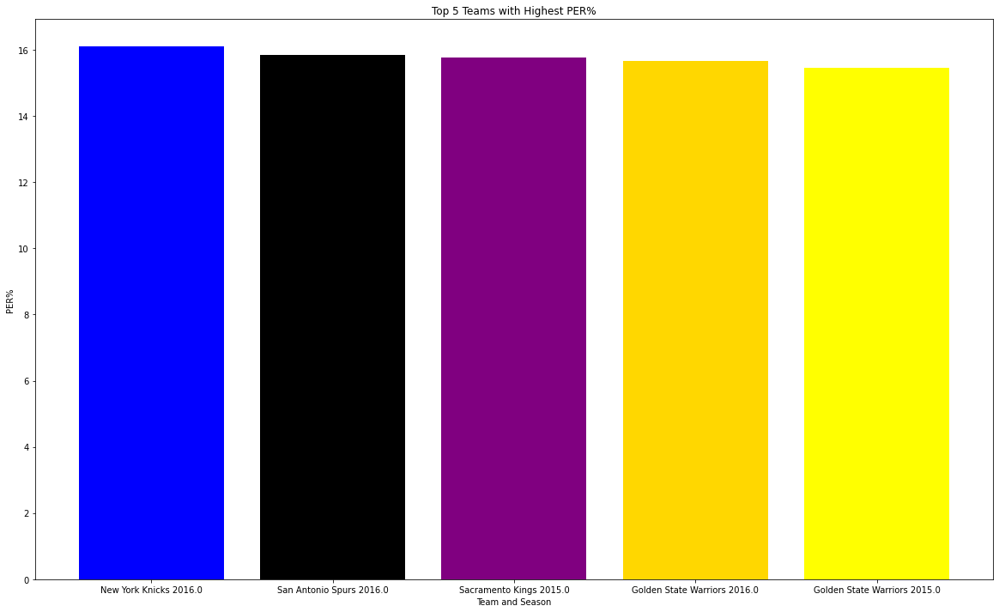

In [190]:
fig = plt.figure(figsize=(20, 12))
colors = ["Blue", "Black", "Purple", "Gold", "Yellow"]
plt.bar(top_5_teams["Tm"] + " " + top_5_teams["SeasonP"].astype(str), top_5_teams["PER"], color=colors)
plt.title("Top 5 Teams with Highest PER%")
plt.xlabel("Team and Season")
plt.ylabel("PER%")
plt.show()

This code creates a bar chart, displaying the top 5 teams with the highest PER% (Player Efficiency Rating). The chart has a custom size (20 inches wide by 12 inches tall), uses a different color for each bar, and labels the x-axis with the team name and season period. The chart has a title, x-axis label, and y-axis label, and is shown upon executing the code.

In [191]:
teams = [("New York Knicks", 2016.0),
         ("San Antonio Spurs", 2016.0),
         ("Sacramento Kings", 2015.0),
         ("Golden State Warriors", 2016.0),
         ("Golden State Warriors", 2015.0)]
mask = df.apply(lambda x: (x["Team"], x["Seasons"]) in teams, axis=1)
wins_by_team = df[mask][["Team", "Seasons", "W"]]
wins_by_team = wins_by_team.groupby(["Team", "Seasons"]).max().reset_index()
print(wins_by_team)

                    Team  Seasons     W
0  Golden State Warriors   2015.0  67.0
1  Golden State Warriors   2016.0  73.0
2        New York Knicks   2016.0  32.0
3       Sacramento Kings   2015.0  29.0
4      San Antonio Spurs   2016.0  67.0


This code applies a mask to the 'df' DataFrame, selecting rows where the "Team" and "Seasons" values match the specified teams and seasons. The filtered DataFrame 'wins_by_team' contains the columns "Team", "Seasons", and "W" (Wins), and is grouped by "Team" and "Seasons" to find the maximum wins for each team in the specified seasons. The DataFrame is printed, showing the team names, seasons, and maximum wins in those seasons.

<BarContainer object of 5 artists>

Text(0.5, 1.0, 'Highest Number of Wins by Team and Season')

Text(0.5, 0, 'Team and Season')

Text(0, 0.5, 'Wins')

([0, 1, 2, 3, 4],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

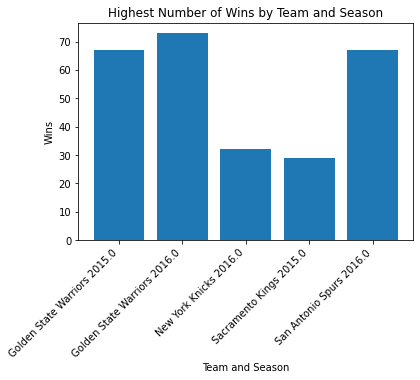

In [192]:
wins_by_team = wins_by_team.groupby(["Team", "Seasons"]).max().reset_index()
team_seasons = wins_by_team["Team"] + " " + wins_by_team["Seasons"].astype(str)
wins = wins_by_team["W"]
plt.bar(team_seasons, wins)
plt.title("Highest Number of Wins by Team and Season")
plt.xlabel("Team and Season")
plt.ylabel("Wins")
plt.xticks(rotation=45, ha="right")
plt.show()

This code creates a bar chart displaying the highest number of wins by the specified teams and seasons. 

Findings Analysis: From this Data Exploration we can gain insights into the relationship between a player's PER and their team's performance. For example, we see a strong positive correlation between these variables for both the Golden State Warrior Teams and the San Antonio teams, however we can conclude that a high PER is not good indicator of a player's value to their team for the New York Knicks and Sacramento Kings. 3/5 teams indicate that having a higher PER is benificial to a teams Win records. 

### Data Exploration #2

The purpose of this exploration is to understand if the number of wins contributed by a player through their offense and defense contributes to their teams success. Also the examination of WS/48 is shown compared to the top teams.

Offense: 

In [193]:
cols = ["SeasonP", "Player", "Pos", "Tm", "OWS"]
sorted_df = df[cols].sort_values(by="OWS", ascending=False)
sorted_df = sorted_df.drop_duplicates(subset=cols)
print(sorted_df.head(5))

       SeasonP         Player Pos                     Tm   OWS
31742   2016.0  Stephen Curry  PG  Golden State Warriors  13.8
9561    2015.0     Chris Paul  PG   Los Angeles Clippers  12.9
17826   2015.0   James Harden  SG        Houston Rockets  12.2
11202   2015.0  Stephen Curry  PG  Golden State Warriors  11.5
49516   2017.0   James Harden  PG        Houston Rockets  11.5


This code selects the specified columns "SeasonP", "Player", "Pos", "Tm", and "OWS" from the 'df' DataFrame, sorts the DataFrame by the "OWS" (Offensive Win Shares) column in descending order, and removes any duplicate rows based on the selected columns. It then prints the top 5 rows of the sorted DataFrame, displaying the top 5 players with the highest OWS.

In [194]:
teams = [("Golden State Warriors", 2016.0),
         ("Los Angeles Clippers", 2015.0),
         ("Houston Rockets", 2015.0),
         ("Golden State Warriors", 2015.0),
         ("Houston Rockets", 2015.0)]
mask = df.apply(lambda x: (x["Team"], x["Seasons"]) in teams, axis=1)
wins_by_team = df[mask][["Team", "Seasons", "W"]]
wins_by_team = wins_by_team.groupby(["Team", "Seasons"]).max().reset_index()
print(wins_by_team)

                    Team  Seasons     W
0  Golden State Warriors   2015.0  67.0
1  Golden State Warriors   2016.0  73.0
2        Houston Rockets   2015.0  56.0
3   Los Angeles Clippers   2015.0  56.0


This code applies a mask to the 'df' DataFrame, selecting rows where the "Team" and "Seasons" values match the specified teams and seasons. The filtered DataFrame 'wins_by_team' contains the columns "Team", "Seasons", and "W" (Wins), and is grouped by "Team" and "Seasons" to find the maximum wins for each team in the specified seasons. The DataFrame is printed, showing the team names, seasons, and maximum wins in those seasons.

Findings Analysis: Having a larger OWS beats out defense, as all teams who have players inside of the top 5 for OWS are leading their conferences with great records. 

Defense:

In [195]:
cols = ["SeasonP", "Player", "Pos", "Tm", "DWS"]
sorted_df = df[cols].sort_values(by="DWS", ascending=False)
sorted_df = sorted_df.drop_duplicates(subset=cols)
print(sorted_df.head(5))

       SeasonP          Player Pos                    Tm  DWS
40570   2017.0     Rudy Gobert   C             Utah Jazz  6.0
23331   2016.0    Paul Millsap  PF         Atlanta Hawks  6.0
24404   2016.0  DeAndre Jordan   C  Los Angeles Clippers  5.5
24822   2016.0  Andre Drummond   C       Detroit Pistons  5.5
21544   2016.0   Kawhi Leonard  SF     San Antonio Spurs  5.5


This code selects the specified columns "SeasonP", "Player", "Pos", "Tm", and "DWS" from the 'df' DataFrame, sorts the DataFrame by the "DWS" (Defensive Win Shares) column in descending order, and removes any duplicate rows based on the selected columns. It then prints the top 5 rows of the sorted DataFrame, displaying the top 5 players with the highest DWS.

In [196]:
teams = [("Utah Jazz", 2017.0),
         ("Atlanta Hawks", 2016.0),
         ("Los Angeles Clippers", 2016.0),
         ("Detroit Pistons", 2016.0),
         ("San Antonio Spurs", 2016.0)]
mask = df.apply(lambda x: (x["Team"], x["Seasons"]) in teams, axis=1)
wins_by_team = df[mask][["Team", "Seasons", "W"]]
wins_by_team = wins_by_team.groupby(["Team", "Seasons"]).max().reset_index()
print(wins_by_team)

                   Team  Seasons     W
0         Atlanta Hawks   2016.0  48.0
1       Detroit Pistons   2016.0  44.0
2  Los Angeles Clippers   2016.0  53.0
3     San Antonio Spurs   2016.0  67.0
4             Utah Jazz   2017.0  51.0


This code applies a mask to the 'df' DataFrame, selecting rows where the "Team" and "Seasons" values match the specified teams and seasons. The filtered DataFrame 'wins_by_team' contains the columns "Team", "Seasons", and "W" (Wins), and is grouped by "Team" and "Seasons" to find the maximum wins for each team in the specified seasons. The DataFrame is printed, showing the team names, seasons, and maximum wins in those seasons.

Analysis: All 5 highest DWS producers are contributing to their teams overall record as all teams have a winning record of over 0.500. 

Win Shares/48:

In [197]:
cols = ["Tm", "WS/48"]
team_data = df[cols].groupby(by="Tm").mean()
top_teams = team_data.sort_values(by="WS/48", ascending=False).iloc[:5]
print(top_teams)

                          WS/48
Tm                             
Golden State Warriors  0.141354
San Antonio Spurs      0.132880
Boston Celtics         0.098849
Miami Heat             0.094400
Toronto Raptors        0.093771


This code selects the "Tm" (Team) and "WS/48" (Win Shares per 48 minutes) columns from the 'df' DataFrame, groups the data by team, and calculates the mean "WS/48" value for each team. It then sorts the resulting team_data DataFrame by "WS/48" in descending order and selects the top 5 teams. 

<BarContainer object of 5 artists>

Text(0.5, 1.0, 'Top 5 Teams by WS/48 Average')

Text(0.5, 0, 'WS/48')

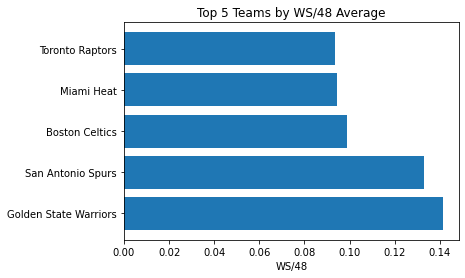

In [198]:
plt.barh(top_teams.index, top_teams["WS/48"])
plt.title("Top 5 Teams by WS/48 Average")
plt.xlabel("WS/48")
plt.show()

This code creates a horizontal bar chart displaying the top 5 teams by their average WS/48 (Win Shares per 48 minutes). The y-axis shows the team names, which are the index values of the 'top_teams' DataFrame, while the x-axis represents the WS/48 values. 

In [199]:
df = df.drop_duplicates(subset=['W'])
cols = ["Team", "W"]
team_data = df[cols].drop_duplicates(subset="Team").sort_values(by="W", ascending=False)
top_5_teams = team_data.iloc[:5]["Team"].tolist()
print("The top 5 teams with the highest number of wins are:", top_5_teams)

The top 5 teams with the highest number of wins are: ['Golden State Warriors', 'Atlanta Hawks', 'Los Angeles Clippers', 'San Antonio Spurs', 'Cleveland Cavaliers']


This code removes any duplicate rows from the 'df' DataFrame based on the 'W' (Wins) column, selects the "Team" and "W" columns, and drops any duplicate rows based on the "Team" column. It then sorts the remaining DataFrame by the "W" column in descending order. 

Findings Analysis: From this dataset, it can be identified that the teams who have the best WS/48 also have the best records. This implies that WS/48 is a great indicator to identify the teams success. 

### Data Exploration #3

In [200]:
df = df.drop_duplicates(subset=['W'])
cols_to_analyze = ['W', 'PTS', 'AST', 'TRB', 'STL', 'BLK', 'TOV', 'PF', 'eFG%', 'PER', 'WS', 'VORP']
corr_matrix = df[cols_to_analyze].corr()
print(corr_matrix)

             W       PTS       AST       TRB       STL       BLK       TOV  \
W     1.000000  0.590148  0.643841  0.298960  0.044415  0.253914 -0.375319   
PTS   0.590148  1.000000  0.526764  0.472267  0.116828  0.179129 -0.146201   
AST   0.643841  0.526764  1.000000  0.034341  0.409847  0.377744 -0.109812   
TRB   0.298960  0.472267  0.034341  1.000000 -0.339318  0.173827 -0.051638   
STL   0.044415  0.116828  0.409847 -0.339318  1.000000  0.305973  0.462664   
BLK   0.253914  0.179129  0.377744  0.173827  0.305973  1.000000  0.091594   
TOV  -0.375319 -0.146201 -0.109812 -0.051638  0.462664  0.091594  1.000000   
PF   -0.358026 -0.037584 -0.286985  0.112837  0.218057 -0.140856  0.518540   
eFG%  0.027686  0.361894  0.201055  0.118384  0.043491  0.087963  0.116644   
PER   0.140285 -0.036400  0.198636  0.015304 -0.032039  0.029614  0.122306   
WS    0.010308  0.393785  0.188457  0.125047  0.051156  0.090387  0.108356   
VORP  0.051899  0.308325  0.214601  0.106245  0.031579  0.082553

This code drops all duplicates of the "W" column and then defines a list of columns ('cols_to_analyze') containing various basketball statistics to analyze. It then computes the correlation matrix for these columns in the 'df' DataFrame using the pandas 'corr()' function.

<AxesSubplot:xlabel='W', ylabel='PTS'>

Text(0.5, 0, 'Wins')

Text(0, 0.5, 'Points')

Text(0.5, 1.0, 'Wins vs. Points')

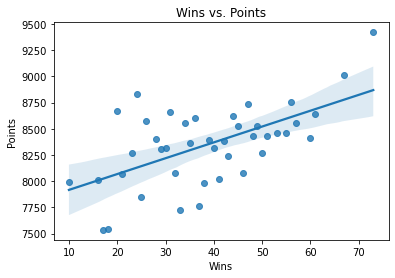

In [201]:
sns.regplot(x='W', y='PTS', data=df)
plt.xlabel('Wins')
plt.ylabel('Points')
plt.title('Wins vs. Points')
plt.show()

This code creates a scatter plot with a regression line to show the relationship between wins and points. 

<AxesSubplot:xlabel='W', ylabel='AST'>

Text(0.5, 0, 'Wins')

Text(0, 0.5, 'Assists')

Text(0.5, 1.0, 'Wins vs. Assists')

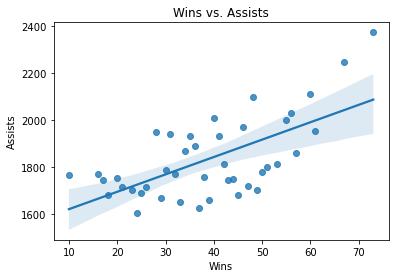

In [202]:
sns.regplot(x='W', y='AST', data=df)
plt.xlabel('Wins')
plt.ylabel('Assists')
plt.title('Wins vs. Assists')
plt.show()

This code creates a scatter plot with a regression line to show the relationship between wins and Assists. 

Text(0.5, 0, 'Turnovers')

Text(0, 0.5, 'Wins')

Text(0.5, 1.0, 'Relationship between Turnovers and Wins')

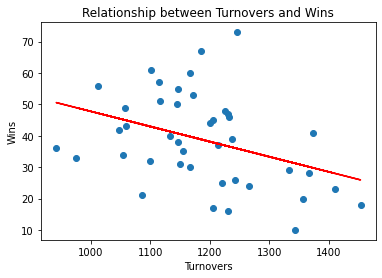

In [203]:
df = df.drop_duplicates()
cols = ["W", "TOV"]
data = df[cols]
model = LinearRegression().fit(data[["TOV"]], data[["W"]])
predicted_wins = model.predict(pd.DataFrame([[100]], columns=["TOV"]))
plt.scatter(data["TOV"], data["W"])
plt.plot(data["TOV"], model.predict(data[["TOV"]]), color="red")
plt.xlabel("Turnovers")
plt.ylabel("Wins")
plt.title("Relationship between Turnovers and Wins")
plt.show()

A linear regression model is  fit using the "TOV" column to predict the "W" column. The model is used to predict the number of wins for a hypothetical team with 100 turnovers. A scatterplot is created to visualize the relationship between turnovers and wins, with the linear regression line plotted in red. 